# Spatial Operations in Image Processing

1. Convolution: Linear Filtering
  - Filtering Noise
  - Gaussian Blur
  - Image Sharpening
2. Edge Detection
3. Median Filters


- Defintion:
   - Spatial operations consist of a neighbourhood. take a 2*2 matrice → apply a function → get the output result. shift the neighborhood, repeat the process for each pixel in the image

---------------------------------------------------
# Convolution: Linear Filtering
- Filter: kernel. Different kernels perform different tasks.
- Defintion:
 ***Z=WX***
   - input: image X
   - Output:another image Z
   - Kernel/filter: parameter W. The array W is made up of values that have been pre-determined.
- 🌟Process Steps🌟:
   - Overlay the kernel with that region of the image,starting off in the top right corner of image.
   - Multiply every element of the image by corresponding element of kernel
   - Summing the after-multiplication results. We get the first element of the image Z.
   - Shift the matrice and repeat the above proccess, we get a new image Z.
- Size Issue Solution:
   - Challenge: The size of new image is different from that of original image
   - Solution: change the size of X by padding
     - In zero padding,we add two additional rows of zeros and two additional columns of zeros.
     - OR we can repulicate the values of the border.
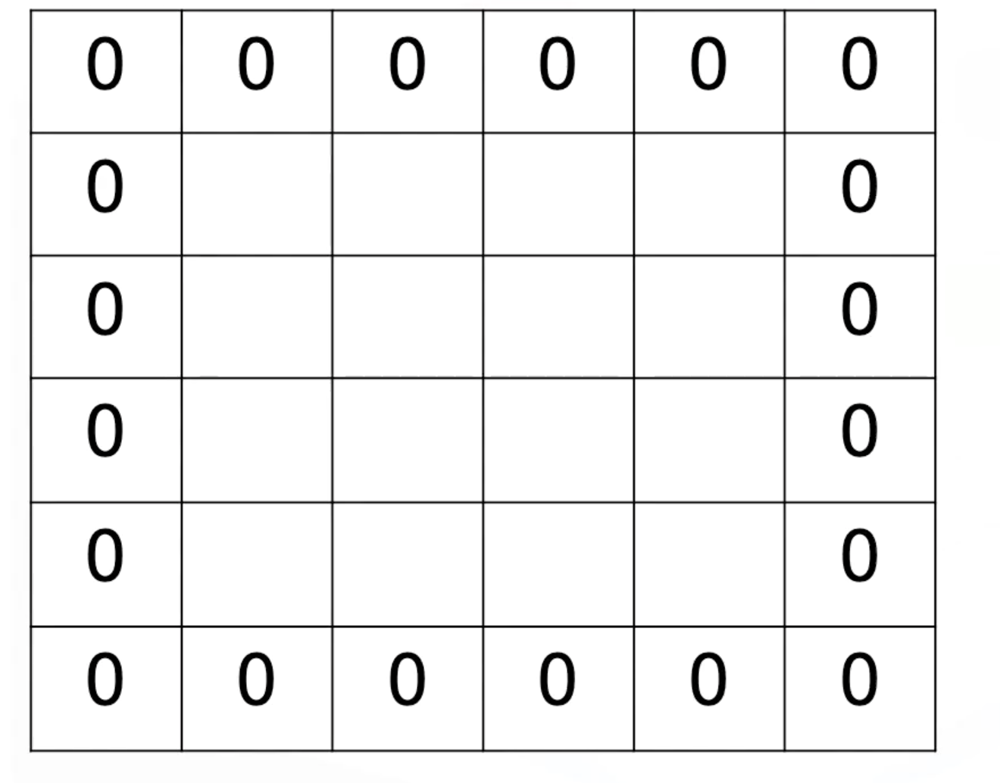
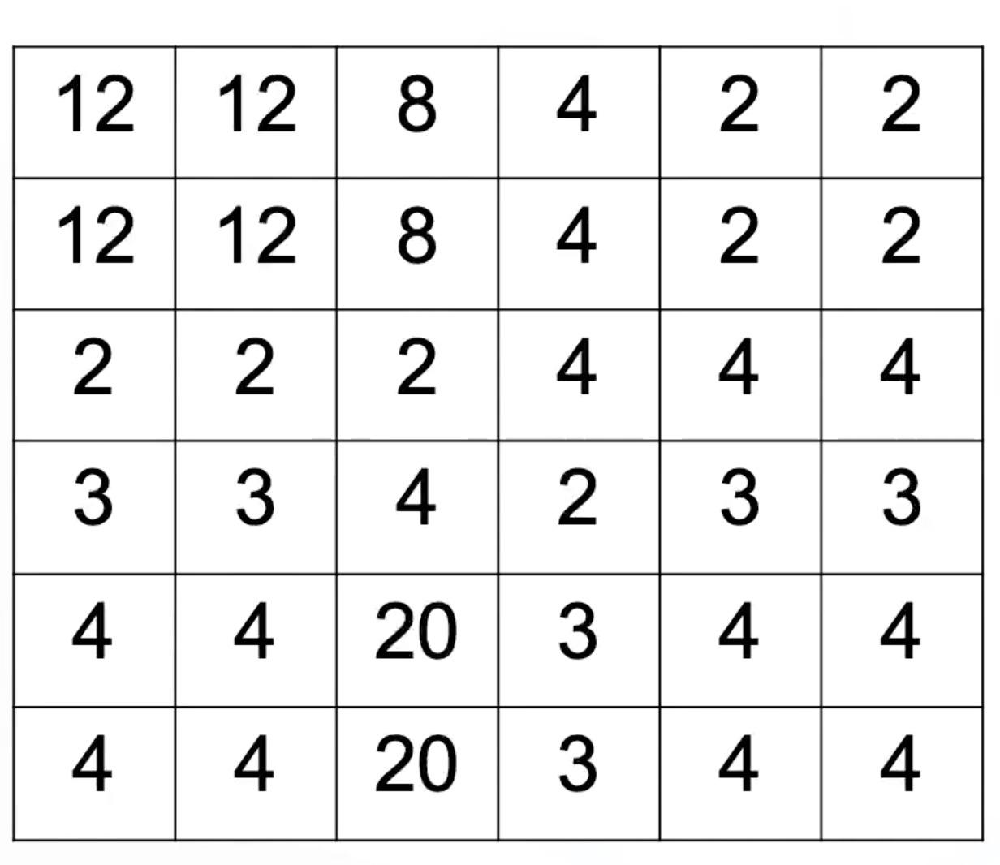




- Low Pass Filter: use to smooth the image getting rid of noise
   - Reduce the noise by applying a `smoothing filter`, averaging out the pixels within a neighborhood.
   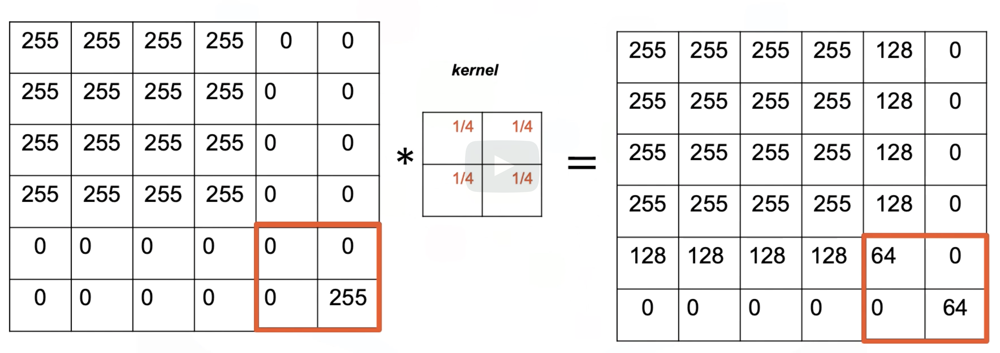

- The intensity of noise has reduced after the process. But the edges appear less sharp.There exists a trade off between **sharpness and smoothness**

----------------------------------------------------------
**Edge Detection**
- Defintions:
   - Edge is where image brightness changes sharply, use methods to approximate derivatives and gradients for identifying.
   - The direction of the vector represents if the adjacent pixel is increasing or decreasing.
- The horizontal changes:  **I[i,j+1]-I[i,j]]**
   - Subtract the intensity value of the adjacent columns j and j+1 in row I.
   - Compute the approximation of the gradient in X-direction 
   - Overlay the result over the image as vectors



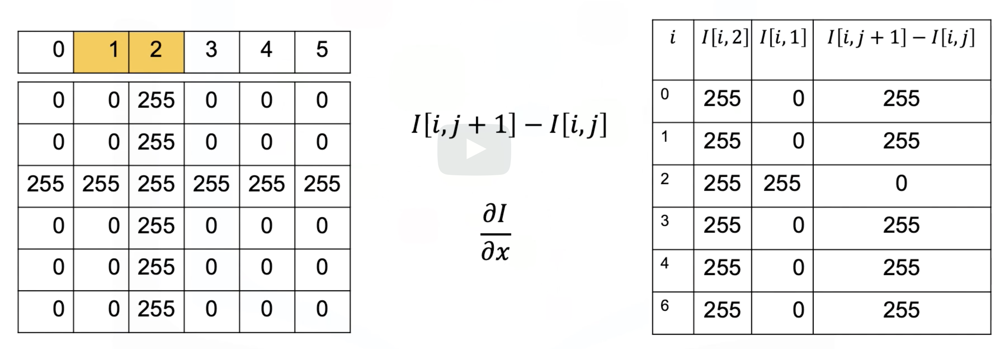

- Horizontal Derivative Approximations
   - compute with Kernel called Sobel operator.
   - The output array of intensities represented as *Gx*. 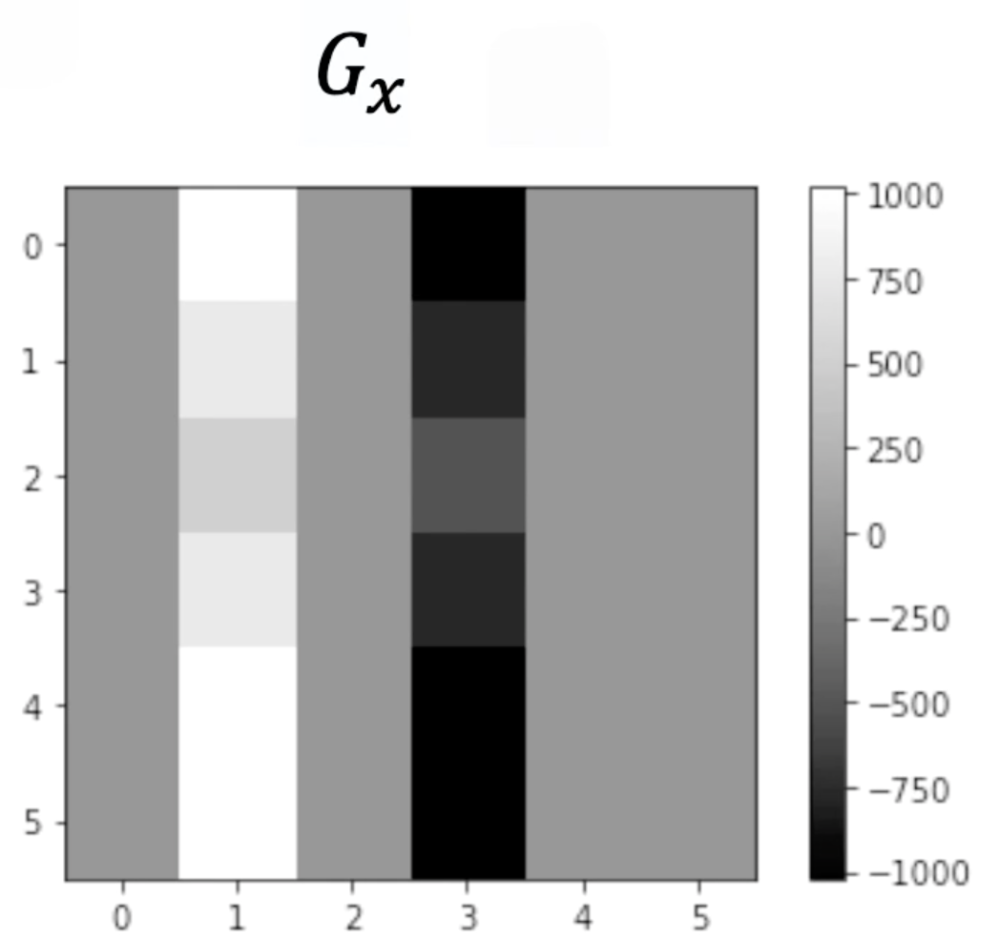
   All the value =0, except the elements corresponding to the horizontal edges.(black:negative, gray:0,white:positive)
- Vertical Changes:
   - computed by convolving the image with a kernel to get the image *Gy*
   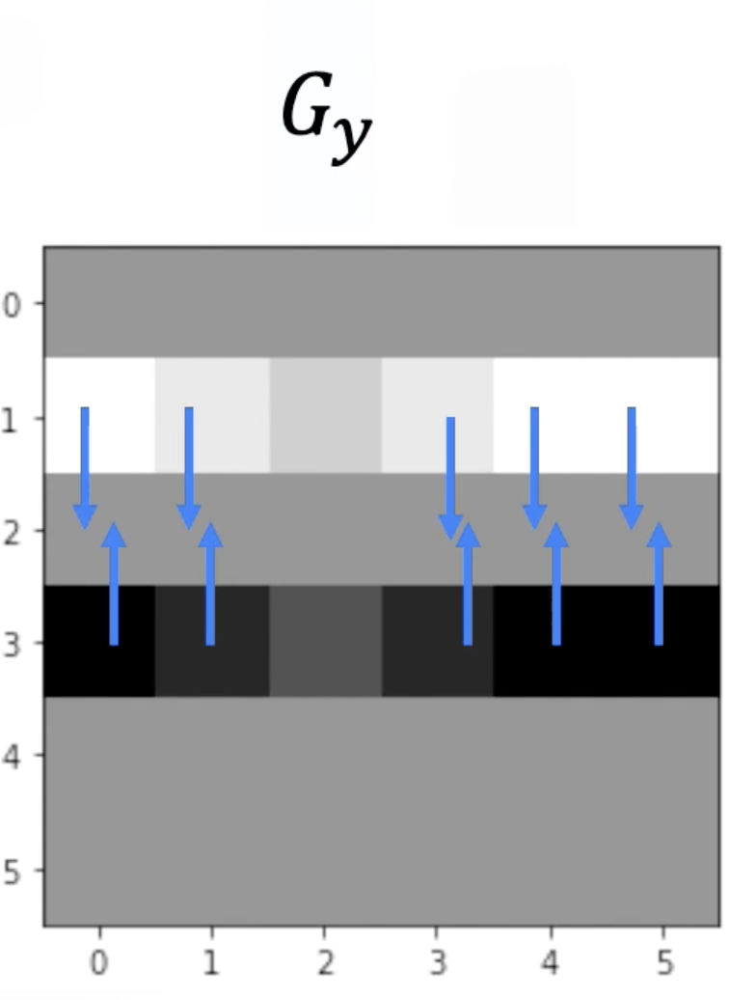
   - The vector direction is vertical
- Combine both vertical and horizontal changes into a vector:
#   G=[Gx,Gy]                       
# ||G||=√(Gx^2+Gy^2)
    - we can plot the image represents the edges
    - calculate the angle representing the *direction*
#    𝛉 = arctan(Gy/Gx)

------------------------------
# Median Filters
- Do better at removing some types of noise but may distort the image.
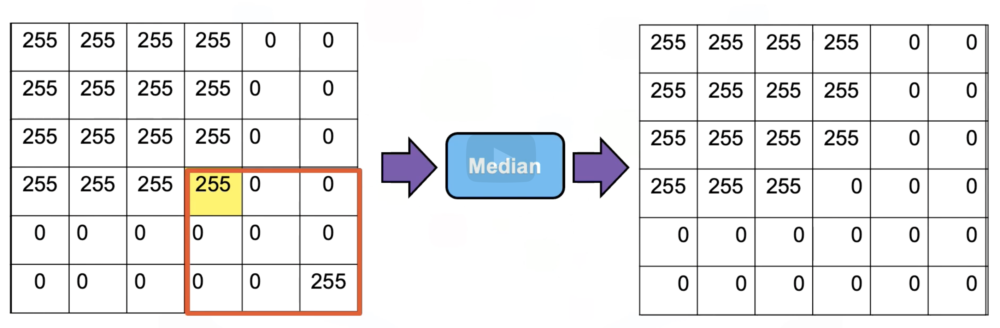

- Output the median value of the neighborhood, in this case we consider 3*3.

In [8]:
#download the images from lab
!wget https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/IBMDeveloperSkillsNetwork-CV0101EN-SkillsNetwork/images%20/images_part_1/cameraman.jpeg
!wget https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/IBMDeveloperSkillsNetwork-CV0101EN-SkillsNetwork/images%20/images_part_1/lenna.png
!wget https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/IBMDeveloperSkillsNetwork-CV0101EN-SkillsNetwork/images%20/images_part_1/barbara.png

--2022-10-05 01:05:04--  https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/IBMDeveloperSkillsNetwork-CV0101EN-SkillsNetwork/images%20/images_part_1/cameraman.jpeg
Resolving cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud (cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud)... 169.45.118.108
Connecting to cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud (cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud)|169.45.118.108|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 7243 (7.1K) [image/jpeg]
Saving to: ‘cameraman.jpeg’

cameraman.jpeg      100%[===================>]   7.07K  --.-KB/s    in 0s      

2022-10-05 01:05:04 (628 MB/s) - ‘cameraman.jpeg’ saved [7243/7243]

--2022-10-05 01:05:04--  https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/IBMDeveloperSkillsNetwork-CV0101EN-SkillsNetwork/images%20/images_part_1/lenna.png
Resolving cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud (

# Pillow

In [42]:
#import the library we need to use
from PIL import Image
import cv2
import numpy as np
import matplotlib.pyplot as plt

In [7]:
#create the function will plot side by side
def plot_image(image_1, image_2,title_1="Orignal",title_2="New Image"):
    plt.figure(figsize=(10,10))

    plt.subplot(1, 2, 1)
    plt.imshow(image_1)
    plt.title(title_1)

    plt.subplot(1, 2, 2)
    plt.imshow(image_2)
    plt.title(title_2)
    
    plt.show()

# Linear Filtering
- Filtering aims to enhance the image (sharpen) and remove the noise from the image
- Usually the noise comes from bad camera or bad image compression.It will lead to blurry image. 
- The filter called kernel and different kernels corresponding to finish different tasks.

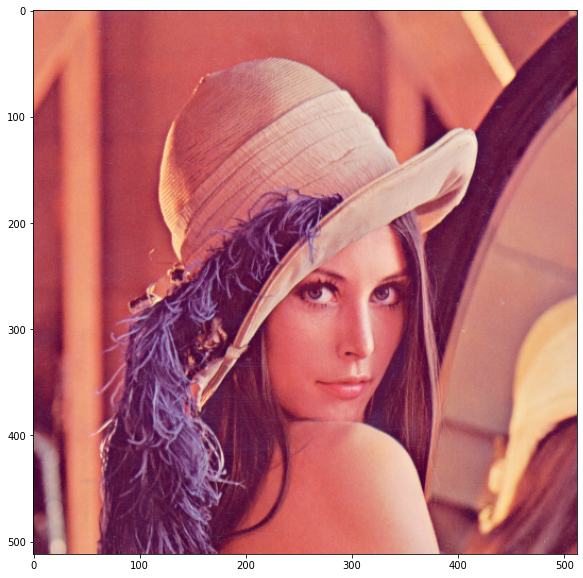

In [12]:
#read the image
img = Image.open("lenna.png")
plt.figure(figsize=(10,10))
plt.imshow(img)
plt.show()

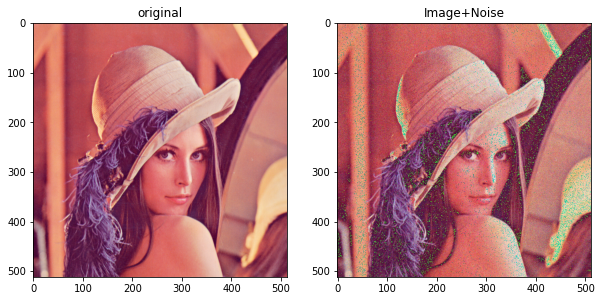

In [14]:
#RGB value (0,255).0 means white noise, which will make graph look grainy.

#get the columns and rows of graph size
rows,cols=img.size
#create values ~NormalDist(0,15^2), range from (0,255) with uint8 type
noise=np.random.normal(0,15,(rows,cols,3)).astype(np.uint8)
#add noise to bear image
noisy_img=img + noise
#create a PIL image from an array
noisy_img=Image.fromarray(noisy_img) #.fromarray():Creates an image memory from an object exporting the array interface
#plot the orignal and noisy image
plot_image(img, noisy_img,title_1="original",title_2="Image+Noise")

# Flitering Noise


In [15]:
from PIL import ImageFilter #https://pillow.readthedocs.io/en/stable/reference/ImageFilter.html

- Low pass filter:Smoothing filters average out the Pixels within a neighborhood.
- Mean filter: the kernel simply averages out the kernels in a neighborhood.

In [16]:
#create a 5*5 array kernel each value is 1/36
kernel=np.ones((5,5))/36
#create a filter kernel by providing the kernel size and flattened kernel
kernel_filter=ImageFilter.Kernel((5,5),kernel.flatten())

- create a convlusion kernel. 
- Code:
`PIL.ImageFilter.Kernel(size, kernel, scale=None, offset=0)`
   - size: (wide,height)
   - kernel: A sequence containing kernel weights.
   - Scale: the result for each pixel is divided by this value.

In [17]:
#filter the image use kernel
img_filtered=noisy_img.filter(kernel_filter)

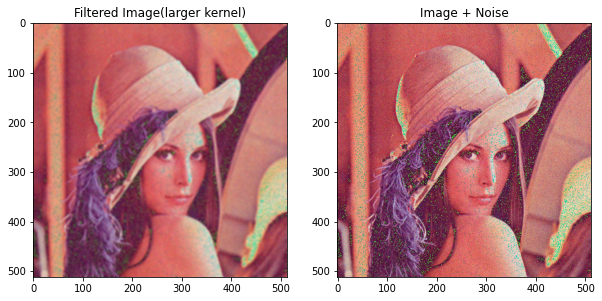

In [19]:
#plot the images w/o filter, the noise is reduced, but the image is blurry
plot_image(img_filtered, noisy_img,title_1="Filtered Image(larger kernel)",title_2="Image + Noise")

- A smaller kernel keeps the image sharp, but filters less noise.

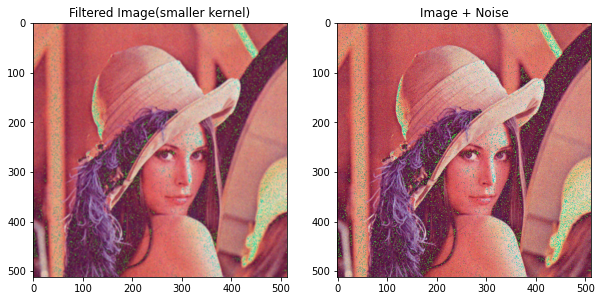

In [20]:
#choose 3*3 array kernel
kernel=np.ones((3,3))/36
#create a imagefilter kernel by providing the kernel size and a flattened kernel
kernel_filter=ImageFilter.Kernel((3,3),kernel.flatten())
img_filtered=noisy_img.filter(kernel_filter)
plot_image(img_filtered, noisy_img,title_1="Filtered Image(smaller kernel)",title_2="Image + Noise")

As the graph shown, the small kernel graph shows more sharpen than the larger kernel one. But the green noise is brighter than the larger kernel one.

# Gaussian Blur
- Blurs the image with a sequence of extended box filters, which approximates a Gaussian kernel
- PARAMETERS:radius – Standard deviation of the Gaussian kernel. Default is 2.
- Code model:`PIL.ImageFilter.GaussianBlur(radius=2)`

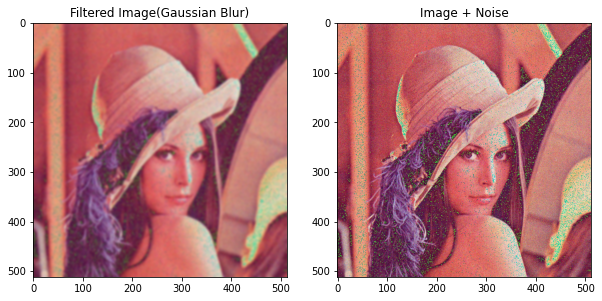

In [22]:
img_filtered = noisy_img.filter(ImageFilter.GaussianBlur)
plot_image(img_filtered , noisy_img,title_1="Filtered Image(Gaussian Blur)",title_2="Image + Noise")

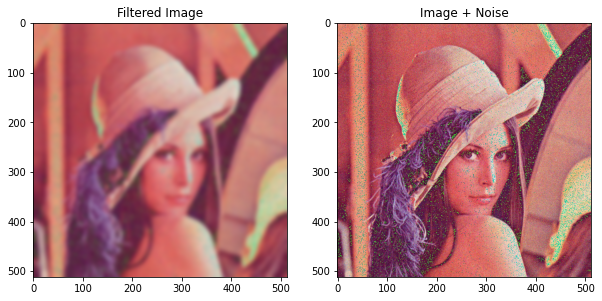

In [23]:
#try 4*4 kernel效果更模糊
img_filtered = noisy_img.filter(ImageFilter.GaussianBlur(4))
plot_image(img_filtered , noisy_img,title_1="Filtered Image",title_2="Image + Noise")

# Image Sharpening
- Smooth the image
- Calculate the derivatives

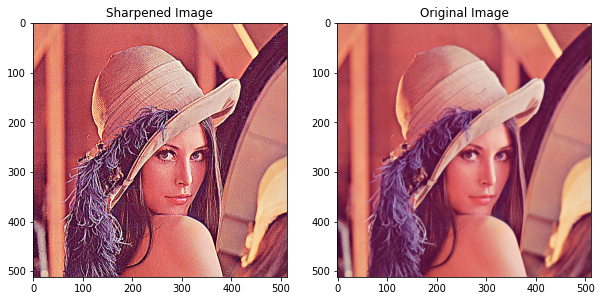

In [24]:
#create a common kernel for image sharpening
kernel = np.array([[-1,-1,-1], 
                   [-1, 9,-1],
                   [-1,-1,-1]])
kernel = ImageFilter.Kernel((3,3), kernel.flatten())
#apply the sharpen filter use kernel on the original img
sharpened = img.filter(kernel)
plot_image(sharpened, img, title_1="Sharpened Image",title_2="Original Image")

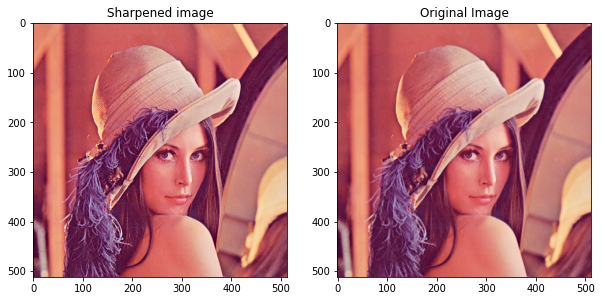

In [26]:
#sharpening the graph with a pre-defined filter
sharpened = img.filter(ImageFilter.SHARPEN)
plot_image(sharpened , img, title_1="Sharpened image",title_2="Original Image")

# Edge
- The Gradient of a function outputs the rate of change.
- We can approximate the gradient of a grayscale image with convolution.

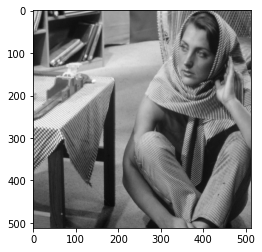

In [28]:
img_gray = Image.open('barbara.png')
plt.imshow(img_gray ,cmap='gray')

**Edge Detection**:find edge which detects discontinuities in Image regions like stark changes in brightness/Intensity value of pixels with `EDGE_ENHANCE` & `FIND_EDGES` in filter function.

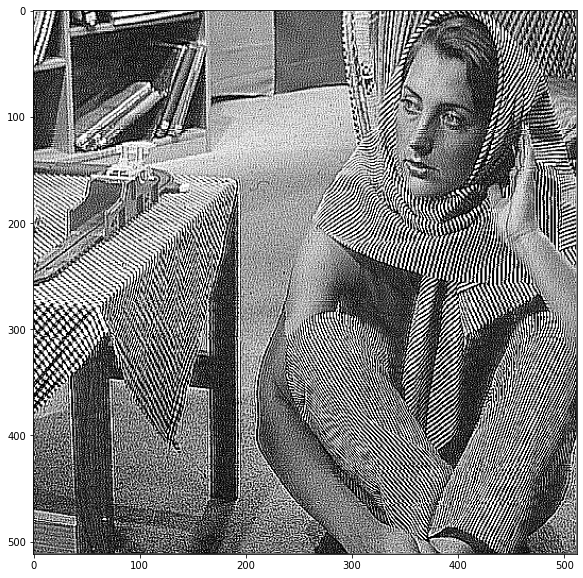

In [30]:
#Enhance the edge, use `EDGE_ENHANCE` filter
img_gray = img_gray.filter(ImageFilter.EDGE_ENHANCE)
# Renders the enhanced image
plt.figure(figsize=(10,10))
plt.imshow(img_gray ,cmap='gray')

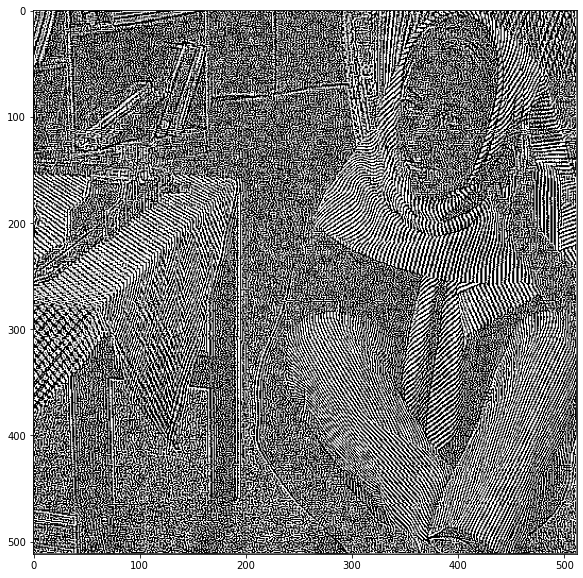

In [31]:
# Filters the images using `FIND_EDGES` filter
img_gray = img_gray.filter(ImageFilter.FIND_EDGES)
# Renders the filtered image
plt.figure(figsize=(10,10))
plt.imshow(img_gray ,cmap='gray')

# Median
- Apply median for improving image segmentation.

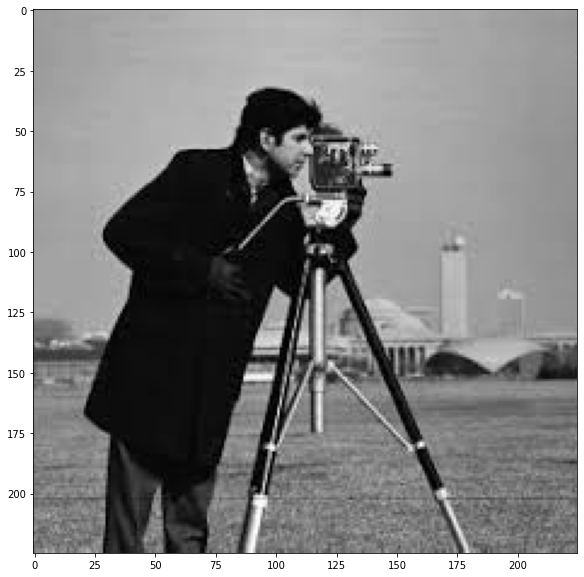

In [40]:
# Load the camera man image
image = Image.open("cameraman.jpeg")
plt.figure(figsize=(10,10))
plt.imshow(image,cmap="gray")

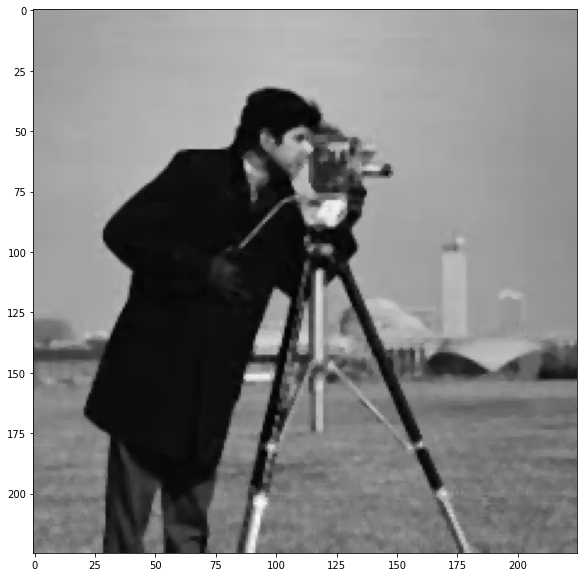

In [41]:
image = image.filter(ImageFilter.MedianFilter)
plt.figure(figsize=(10,10))
# Renders the image
plt.imshow(image,cmap="gray")

Result: Median filtering blurs the background, increasing the segmentation between the cameraman and the background

# OpenCV

In [64]:
def image_plot(image_1, image_2,title_1="Orignal",title_2="New Image"):
    plt.figure(figsize=(10,10))
    plt.subplot(1, 2, 1)
    plt.imshow(cv2.cvtColor(image_1, cv2.COLOR_BGR2RGB))
    plt.title(title_1)
    plt.subplot(1, 2, 2)
    plt.imshow(cv2.cvtColor(image_2, cv2.COLOR_BGR2RGB))
    plt.title(title_2)
    plt.show()

# Linear Filtering

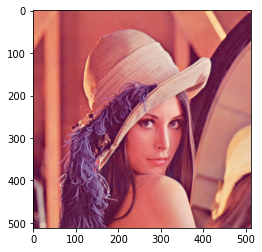

In [62]:
# Loads the image
img = cv2.imread("lenna.png")
# Converts the order of the color from BGR (Blue Green Red) to RGB (Red Green Blue) then renders the image from the array of data
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))

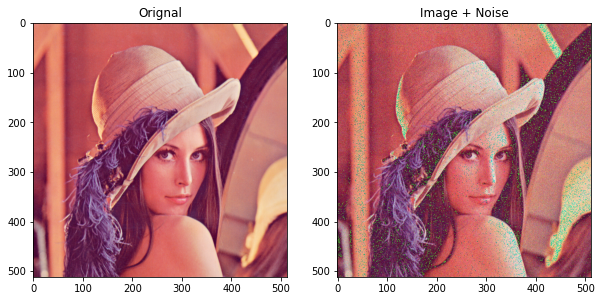

In [65]:
rows, cols,_= img.shape
noise = np.random.normal(0,15,(rows,cols,3)).astype(np.uint8)
# Add the noise to the image
noisy_img = img + noise
# Plots the original image and the image with noise 
image_plot(img, noisy_img, title_1="Orignal",title_2="Image + Noise")

# Filtering Noise

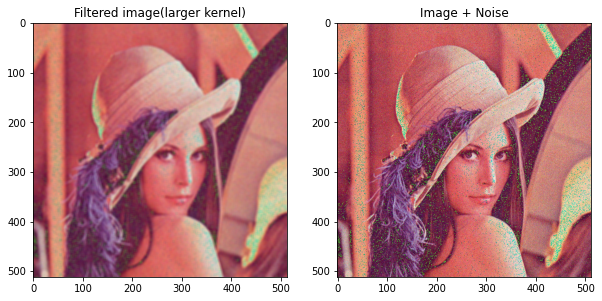

In [70]:
kernel = np.ones((6,6))/36
image_filtered = cv2.filter2D(src=noisy_img, ddepth=-1, kernel=kernel)
image_plot(image_filtered, noisy_img,title_1="Filtered image(larger kernel)",title_2="Image + Noise")

`cv.filter2D(	src, ddepth, kernel[, dst[, anchor[, delta[, borderType]]]])`

- `src`:input image
- `ddepth`:the size of the output image
https://docs.opencv.org/4.6.0/d4/d86/group__imgproc__filter.html#ga27c049795ce870216ddfb366086b5a04

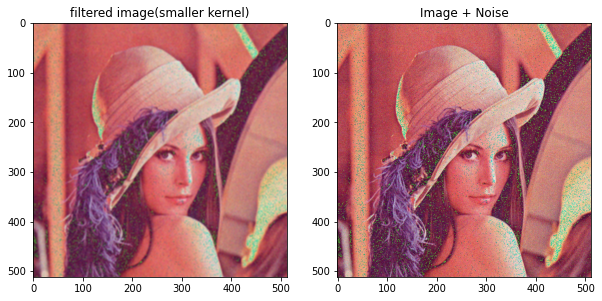

In [71]:
# Creates a kernel which is a 4 by 4 array where each value is 1/16
kernel = np.ones((4,4))/16
# Filters the images using the kernel
image_filtered=cv2.filter2D(src=noisy_img,ddepth=-1,kernel=kernel)
# Plots the Filtered and Image with Noise using the function defined at the top
image_plot(image_filtered , noisy_img,title_1="filtered image(smaller kernel)",title_2="Image + Noise")

# Gaussian Blur
-  `GaussianBlur` function convolves the src image with the specified *Gaussian kernel*. It filters noise but does a better job of **preserving the edges**.
- Parameters:
   - src: input image with any number of channels
   - ksize: Gaussian kernel size
   - dst:	output image of the same size and type as src.
   - sigmaX:	Gaussian kernel *standard deviation in X direction.*
   - sigmaY:	Gaussian kernel *standard deviation in Y direction*.
     - If sigmaY=0,it is set to be equal to sigmaX
     - If both sigmas are 0, they are computed from *ksize.width* and *ksize.height*.
     - Sigma behaves like the size of the mean filter, a **larger** value of sigma will make the image **blurry**.


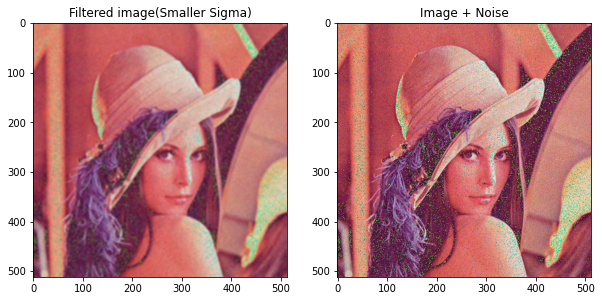

In [73]:
# Filters the images using GaussianBlur on the image with noise using a 4 by 4 kernel 
image_filtered = cv2.GaussianBlur(noisy_img,(5,5),sigmaX=4,sigmaY=4)
# Plots the Filtered Image then the Unfiltered Image with Noise
image_plot(image_filtered , noisy_img,title_1="Filtered image(Smaller Sigma)",title_2="Image + Noise")

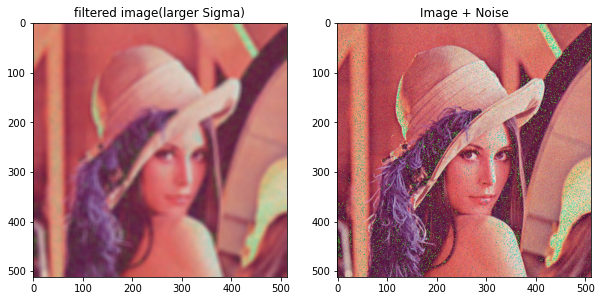

In [75]:
# Filters the images using GaussianBlur on the image with noise using a 11 by 11 kernel 
image_filtered = cv2.GaussianBlur(noisy_img,(11,11),sigmaX=10,sigmaY=10)
# Plots the Filtered Image then the Unfiltered Image with Noise
image_plot(image_filtered , noisy_img,title_1="filtered image(larger Sigma)",title_2="Image + Noise")

# Image Sharpening

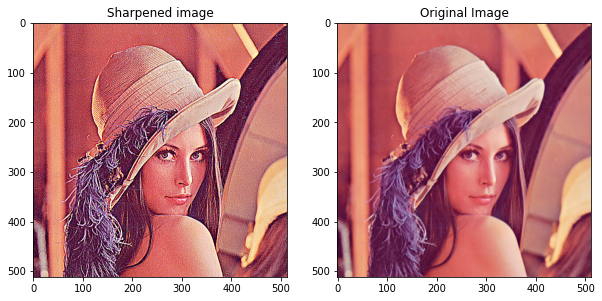

In [77]:
# create a common Kernel for image sharpening
kernel = np.array([[-1,-1,-1], 
                   [-1, 9,-1],
                   [-1,-1,-1]])
# Applys the sharpening filter using kernel on the original image
sharpened = cv2.filter2D(img, -1, kernel)
# Plots the sharpened image and the original image without noise
image_plot(sharpened , img, title_1="Sharpened image",title_2="Original Image")

# Edge
Use Sobel edge detector

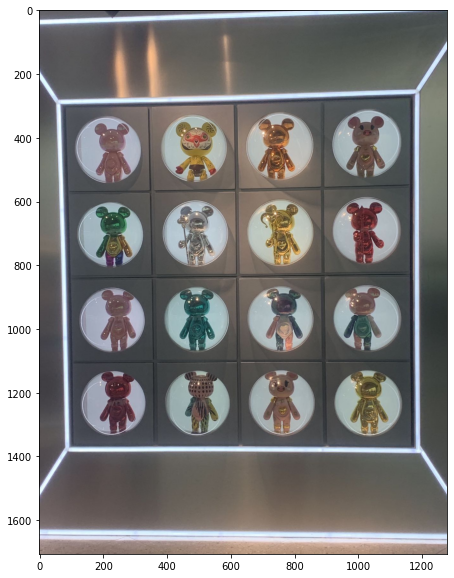

In [93]:
img_bear = cv2.imread('Bear.png')
plt.figure(figsize=(10,10))
plt.imshow(cv2.cvtColor(img_bear, cv2.COLOR_BGR2RGB))

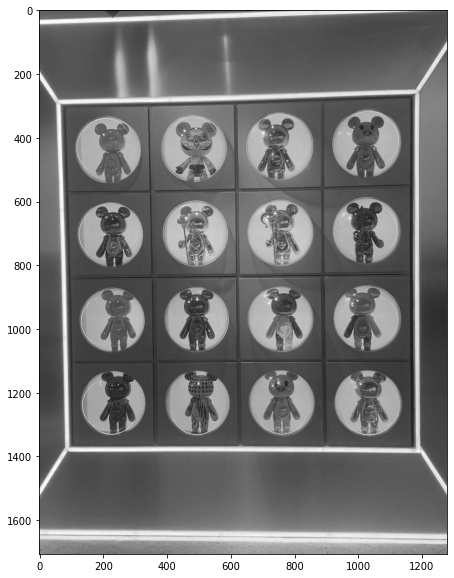

In [94]:
img_gray = cv2.imread('Bear.png', cv2.IMREAD_GRAYSCALE)
plt.figure(figsize=(10,10))
plt.imshow(img_gray ,cmap='gray')

Smooth the image,decreasing changes may be caused by noise.

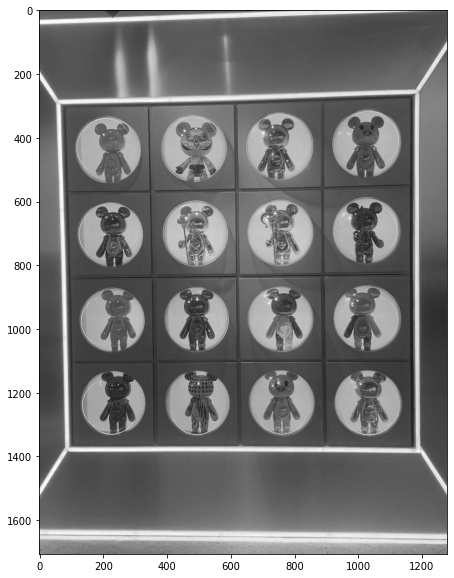

In [90]:
# Filters the images using GaussianBlur on the image with noise using a 3 by 3 kernel 
img_gray = cv2.GaussianBlur(img_gray,(3,3),sigmaX=0.1,sigmaY=0.1)
plt.figure(figsize=(10,10))
plt.imshow(img_gray ,cmap='gray')

**Sobel function**:
   - `cv.Sobel(	src, ddepth, dx, dy[, dst[, ksize[, scale[, delta[, borderType]]]]])` 
   - parameters:
      - dx:order of the derivative x.
      - dy:order of the derivative y.
      - ksize:size of the extended Sobel kernel; it must be 1, 3, 5, or 7.

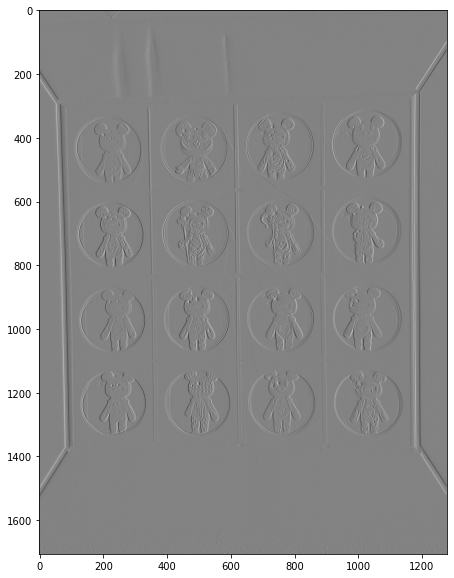

In [89]:
ddepth = cv2.CV_16S #openCV中的数据类型
# Applys the filter on the image in the X direction
grad_x = cv2.Sobel(src=img_gray, ddepth=ddepth, dx=1, dy=0, ksize=3)
plt.figure(figsize=(10,10))
plt.imshow(grad_x,cmap='gray')

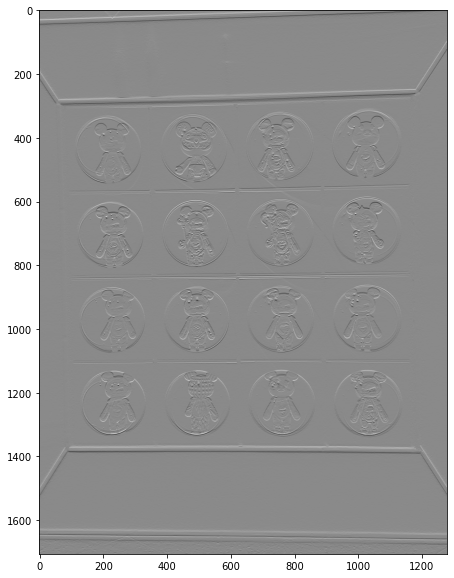

In [88]:
# Applys the filter on the image in the Y direction
grad_y = cv2.Sobel(src=img_gray, ddepth=ddepth, dx=0, dy=1, ksize=3)
plt.figure(figsize=(10,10))
plt.imshow(grad_y,cmap='gray')

Approximate the gradient by calculating **absolute values** and converts the result to 8-bit

In [83]:
# Converts the values back to a number between 0 and 255
abs_grad_x = cv2.convertScaleAbs(grad_x)
abs_grad_y = cv2.convertScaleAbs(grad_y)

Apply the function `addWeighted` to calculates **the sum of two arrays**.
- `cv.addWeighted(src1, alpha, src2, beta, gamma[, dst[, dtype]])`
- Parameters
   - src1:first input array.
   - alpha:weight of the first array elements.
   - src2:second input array of the same size and channel number as src1.
   - beta:weight of the second array elements.
   - gamma:scalar added to each sum.

In [84]:
# Adds the derivative in the X and Y direction
grad = cv2.addWeighted(abs_grad_x, 0.5, abs_grad_y, 0.5, 0)

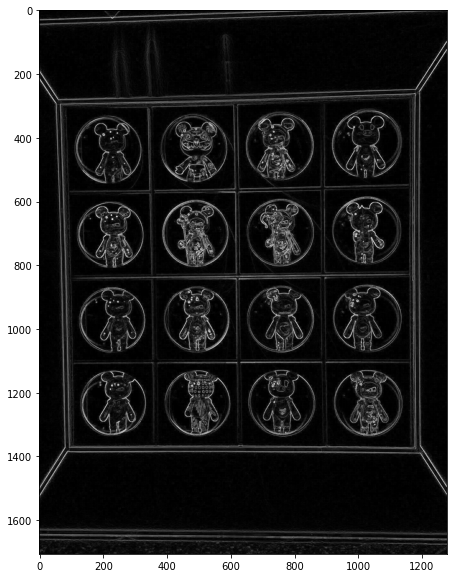

In [85]:
# plot the image
plt.figure(figsize=(10,10))
plt.imshow(grad,cmap='gray')

Result: the image with lines have high-intensity values representing a large gradient.

# Median

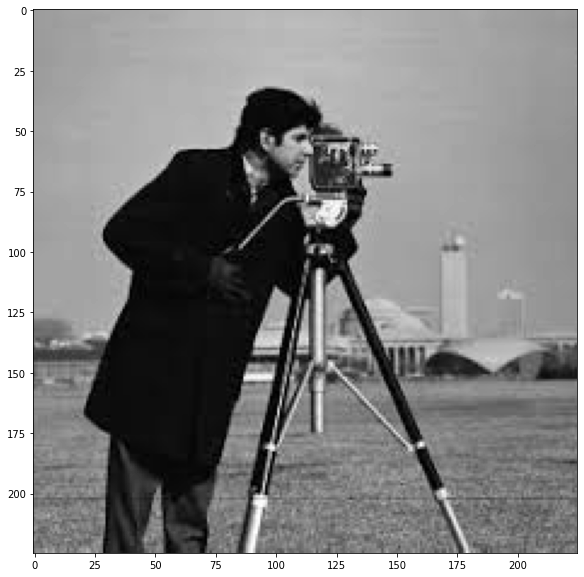

In [86]:
image = cv2.imread("cameraman.jpeg",cv2.IMREAD_GRAYSCALE)
plt.figure(figsize=(10,10))
plt.imshow(image,cmap="gray")

`medianBlur` function: 
   - src:imput image
   - ksize:kernel size

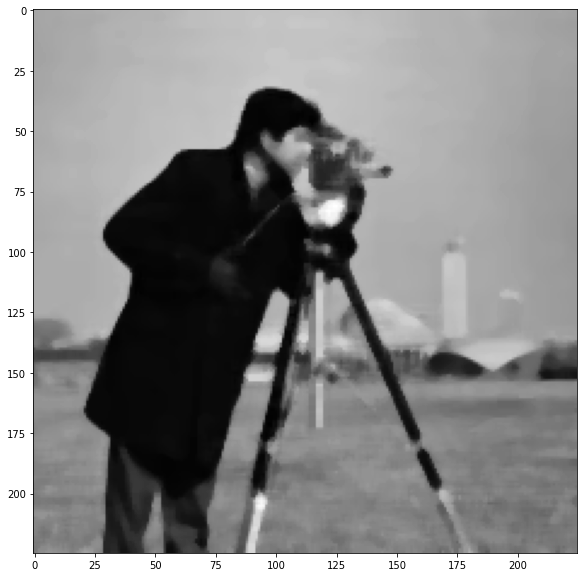

In [87]:
# Filter the image using Median Blur with a kernel of size 5
filtered_image = cv2.medianBlur(image, 5)

plt.figure(figsize=(10,10))
plt.imshow(filtered_image,cmap="gray")

# Threshold
- `cv.threshold(	src, thresh, maxval, type[, dst])`
   - maxval:	maximum value to use with the `THRESH_BINARY` and `THRESH_BINARY_INV` thresholding types.
   - type: thresholding types.


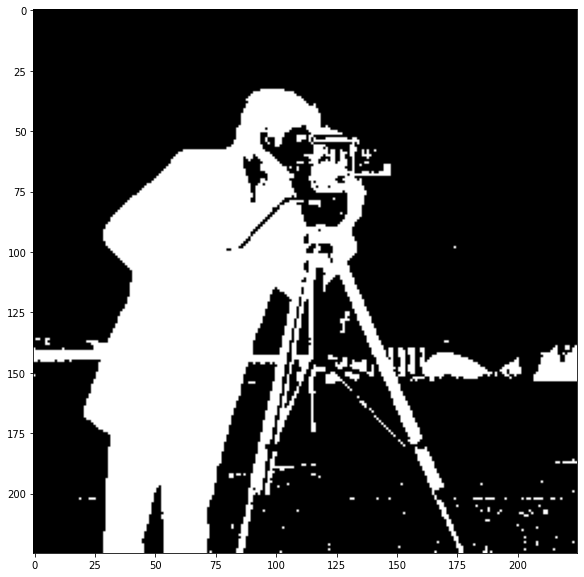

In [95]:
# Returns(ret) which is the threshold used and outs which is the image
ret, outs = cv2.threshold(src = image, thresh = 0, maxval = 255, type = cv2.THRESH_OTSU+cv2.THRESH_BINARY_INV)

plt.figure(figsize=(10,10))
plt.imshow(outs, cmap='gray')